In [1]:
%matplotlib inline

In [2]:
%pip install monai
%pip install lightning
%pip install nibabel
%pip install scikit-image


     ---------------------------------------- 0.0/56.8 kB ? eta -:--:--
     ------------- ------------------------ 20.5/56.8 kB 330.3 kB/s eta 0:00:01
     --------------------------- ---------- 41.0/56.8 kB 393.8 kB/s eta 0:00:01
     -------------------------------------- 56.8/56.8 kB 427.4 kB/s eta 0:00:00
   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   -- ------------------------------------- 0.1/2.1 MB 4.2 MB/s eta 0:00:01
   -------------- ------------------------- 0.8/2.1 MB 9.6 MB/s eta 0:00:01
   ---------------------------- ----------- 1.4/2.1 MB 13.0 MB/s eta 0:00:01
   ---------------------------------- ----- 1.8/2.1 MB 10.1 MB/s eta 0:00:01
   ---------------------------------------- 2.1/2.1 MB 9.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [57]:
import zipfile
with zipfile.ZipFile("../data/models/unet-ssim-loss.zip", 'r') as zip_ref:
  # zip_ref.extractall("../data/models")

In [52]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pytorch_lightning as pl 
import os 
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity
from pathlib import Path
import torch 
import nibabel as nib
import torch.nn.functional as F
import torch.nn as nn
from typing import Literal
from monai.networks.nets import UNet
# Structural Similarity Loss
from monai.losses import SSIMLoss
from monai.networks.layers import Norm
from monai.data import CacheDataset, Dataset, DataLoader, list_data_collate, NibabelReader
from monai.transforms import (
    NormalizeIntensity,
    Compose,
    LoadImaged,
    EnsureChannelFirstd,
    Orientationd,
    SpatialCropd,
    MapTransform,
    SignalFillEmptyd,
    RandSpatialCropd,
    ScaleIntensityd,
    ScaleIntensityRanged, MaskIntensity
)
from monai.data import MetaTensor
from monai.apps.reconstruction.transforms.dictionary import ReferenceBasedNormalizeIntensityd

from ptp.patch_the_planet_utilities import *


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

DATA_DIR = Path('../data')
TARGET_DATA_DIR = DATA_DIR / 'generated_part1_nii_gz'
GEN_DATA_DIR = DATA_DIR / 'generated_part1_missing_nii_gz'
MODELS_DIR = DATA_DIR / 'models'

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [13]:
os.listdir(GEN_DATA_DIR)

['seismicCubes_RFC_fullstack_2023.76346555.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346557.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346560.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346655.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346659.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346660.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346755.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346756.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346757.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346759.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346851.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346962.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76346988.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76347020.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76347055.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76347061.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76347248.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76347250.nii.gz',
 'seismicCubes_RFC_fullstack_2023.76347251.nii.gz',
 'seismicCub

In [14]:
assert sorted(os.listdir(GEN_DATA_DIR)) == sorted(os.listdir(TARGET_DATA_DIR))

In [15]:
corrupted_tf = CorruptedTransform(10, keys=['target'])

target_file = os.listdir(TARGET_DATA_DIR)[0]
target = nib.load(TARGET_DATA_DIR / target_file).get_fdata()

target = MetaTensor(torch.unsqueeze(torch.Tensor(target), 0))
print(target.shape)

data = corrupted_tf({'target': target})

torch.Size([1, 300, 300, 1259])


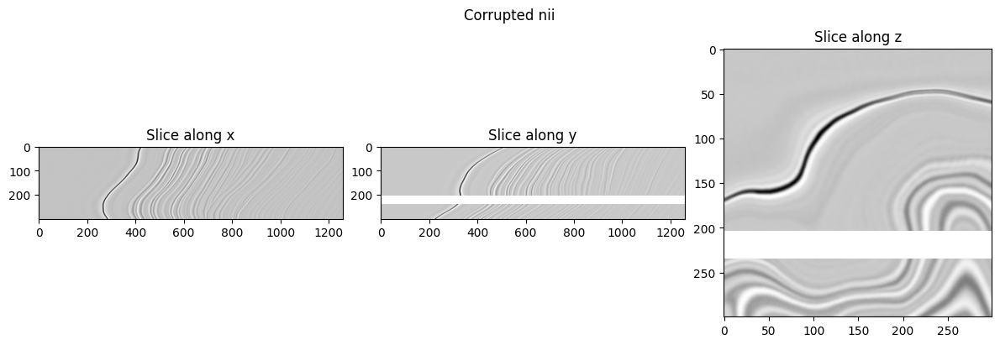

In [16]:
visualize_slices(nib.Nifti1Image(data['image'].as_tensor().numpy()[0], np.eye(4)), 150, 150, 400, f'Corrupted {target_file.split(".")[-2]}')

#### How original and training images differ

Original and corrupted images have different intensities because the later is scaled to some range - thus the same scaling will be applied to the original image

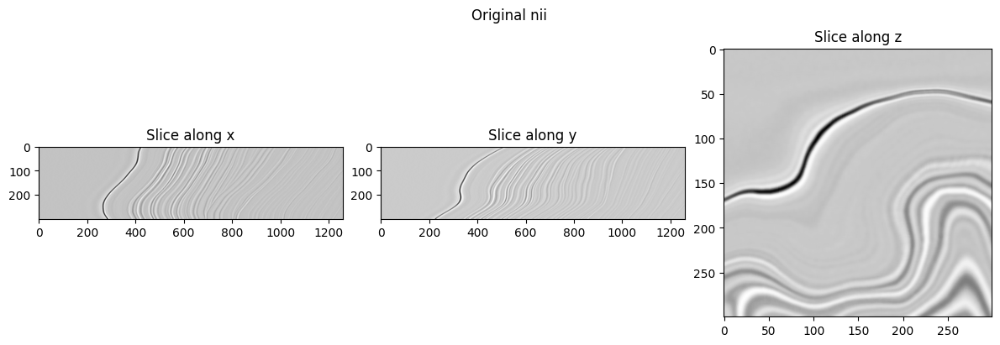

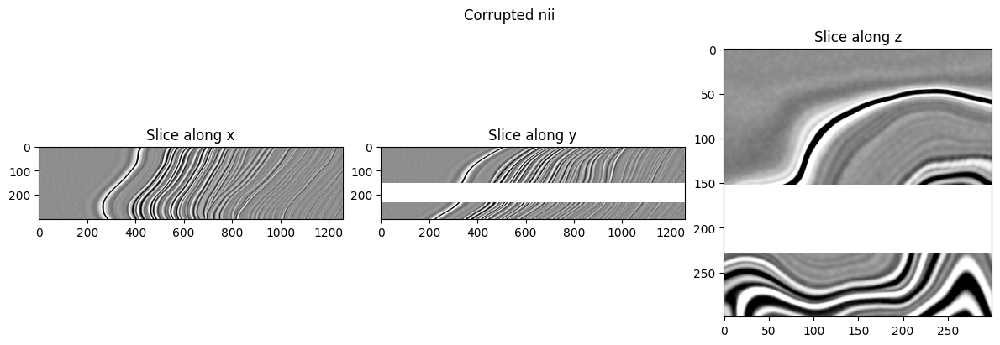

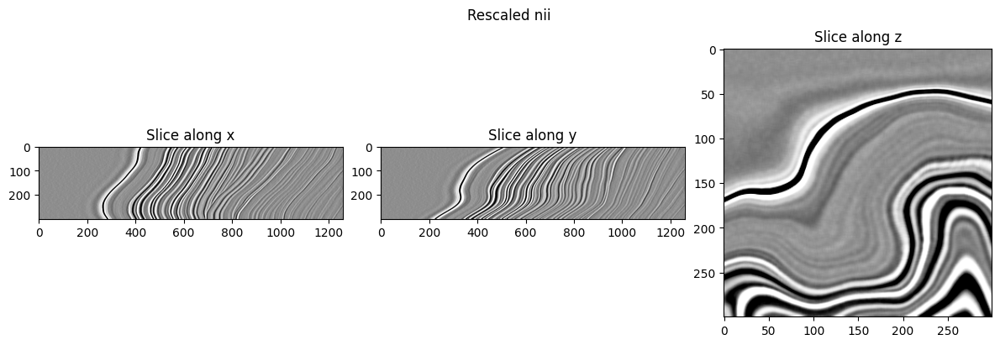

In [17]:
target_file = os.listdir(TARGET_DATA_DIR)[0]
target = nib.load(TARGET_DATA_DIR / target_file)
visualize_slices(target, 150, 150, 400, f'Original {target_file.split(".")[-2]}')
img, _, _ = training_data_generator(target.get_fdata())
target = rescale_volume(target.get_fdata())
visualize_slices(nib.Nifti1Image(img, np.eye(4)), 150, 150, 400, f'Corrupted {target_file.split(".")[-2]}')
visualize_slices(nib.Nifti1Image(target, np.eye(4)), 150, 150, 400, f'Rescaled {target_file.split(".")[-2]}')

In [18]:
class Net(pl.LightningModule):
    
    def __init__(self, percentile=25, loss_func=nn.MSELoss()):
        super().__init__()
        
        self._model = UNet(
            spatial_dims=3,
            in_channels=1,
            out_channels=1,
            channels=(16, 32, 64, 128, 256),
            strides=(2, 2, 2, 2),
            num_res_units=2,
            norm=Norm.BATCH
        )
        
        self.loss_function = loss_func
        self.percentile = percentile
    
    def forward(self, x):
        return self._model(x)
    
    def prepare_data(self):
        images = sorted(os.listdir(GEN_DATA_DIR))
        targets = sorted(os.listdir(TARGET_DATA_DIR))
        
        assert images == targets
        train_dict = [
            {'target': TARGET_DATA_DIR / target_name} for target_name in targets[:20]
        ]
        
        val_dict = [
            {'target': TARGET_DATA_DIR / target_name} for target_name in targets[20:]
        ]
        
        train_transforms = Compose(
            # for now each image would be normalized based on its own mean and std
            [LoadImaged(keys=['target']),
             RescaleTransform(keys=['target']),
             EnsureChannelFirstd(keys=['target']), 
             Orientationd(keys=["target"], axcodes="RAS"),
             RandSpatialCropd(keys=['target'], 
                         roi_size=(256, 256, 256), random_size=False),
             CorruptedTransform(percentile=self.percentile, keys=['target']),
             # Problem: missing areas are nans, which causes everything else to be nan
             SignalFillEmptyd(keys=['image'], replacement=256),
             ScaleIntensityd(keys=["image", "target"]),
            ]
        )
        
        val_transforms = Compose(
            # for now each image would be normalized based on its own mean and std
            [LoadImaged(keys=['target']),
             RescaleTransform(keys=['target']),
             EnsureChannelFirstd(keys=['target']), 
             Orientationd(keys=["target"], axcodes="RAS"),
             SpatialCropd(keys=['target'], roi_center=(150, 150, 750),
                         roi_size=(256, 256, 256)),
             CorruptedTransform(percentile=self.percentile, keys=['target']),
             # Problem: missing areas are nans, which causes everything else to be nan
             SignalFillEmptyd(keys=['image'], replacement=256),
             ScaleIntensityd(keys=["image", "target"]),
            ]
        )
        
        self.train_data = Dataset(
            data = train_dict, 
            transform = train_transforms
        )
        
        self.val_data = Dataset(
            data = val_dict, 
            transform = val_transforms
        )
        
    def train_dataloader(self):
        train_loader = DataLoader(
            self.train_data,
            batch_size=2,
            shuffle=True,
            num_workers=4, 
            collate_fn=list_data_collate
        )
        return train_loader
    
    def val_dataloader(self):
        val_loader = DataLoader(self.val_data, batch_size=1, num_workers=4)
        return val_loader
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self._model.parameters(), 1e-4)
        return optimizer
    
    def validation_step(self, batch, batch_idx):
        images, targets = batch["image"], batch["target"]
        output = self.forward(images)
        loss = self.loss_function(output, targets)
        self.log('val_loss', loss, prog_bar=True, sync_dist=True, on_epoch=True)
        return {"val_loss": loss}
    
    def training_step(self, batch, batch_idx):
        images, targets, mask = batch["image"], batch["target"], batch['mask']
        output = self.forward(images)
        loss = self.loss_function(output, targets)
        self.log('train_loss', loss, prog_bar=True, sync_dist=True, on_epoch=True)
        return {"loss": loss}
        

In [19]:
net = Net()

net.prepare_data()

In [20]:
dataiter = iter(net.train_data)

In [21]:
sample = next(dataiter)

In [22]:
sample.keys()

dict_keys(['target', 'image', 'mask'])

Images are cropped because they can't fit into the memory

In [23]:
sample['image'].shape

torch.Size([1, 256, 256, 256])

In [24]:
original_pt = sample['target'].as_tensor()[0]
corrupted_pt = sample['image'].as_tensor()[0]

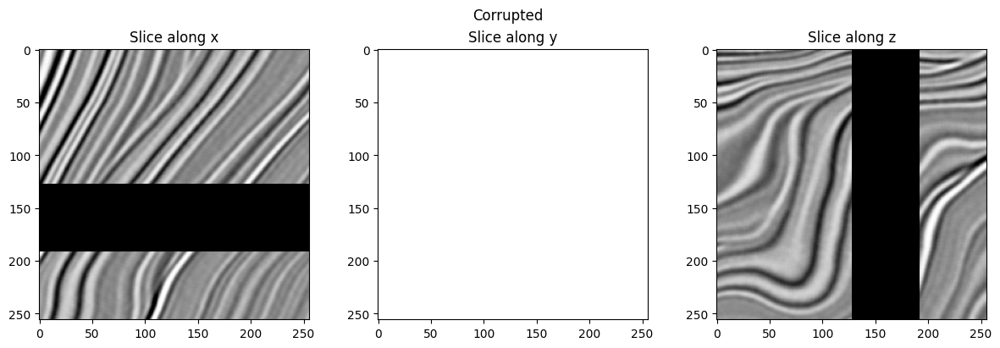

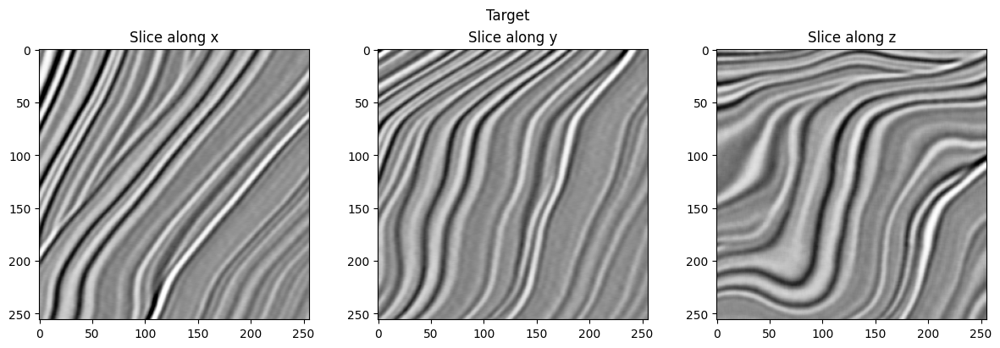

In [27]:
visualize_slices(nib.Nifti1Image(corrupted_pt.numpy(), np.eye(4)), 100, 150, 100, 'Corrupted')
visualize_slices(nib.Nifti1Image(original_pt.numpy(), np.eye(4)), 100, 150, 100, 'Target')

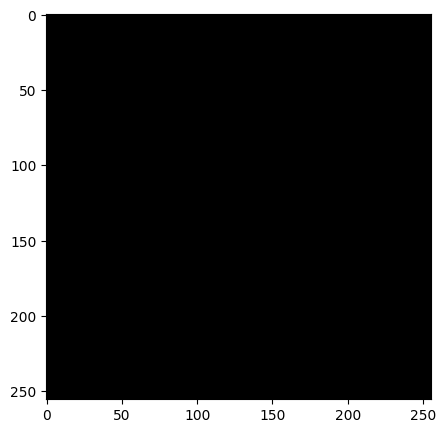

In [28]:
plt.figure(figsize=(5, 5))
plt.imshow(sample['mask'].numpy()[0, :, 100, :], cmap='gray')

In [29]:
corrupted_pt.numpy()[100, :, :]

array([[0.46942347, 0.46484375, 0.53125   , ..., 0.48316273, 0.4854526 ,
        0.49232218],
       [0.46484375, 0.48774245, 0.55872846, ..., 0.48087284, 0.48087284,
        0.48774245],
       [0.46484375, 0.51064116, 0.5862069 , ..., 0.47858298, 0.4854526 ,
        0.49461207],
       ...,
       [0.50377154, 0.5175108 , 0.50835127, ..., 0.4053071 , 0.38469827,
        0.3915679 ],
       [0.50606143, 0.5175108 , 0.50148165, ..., 0.39385778, 0.38011855,
        0.40072736],
       [0.51293105, 0.51293105, 0.48774245, ..., 0.39614764, 0.3984375 ,
        0.4373653 ]], dtype=float32)

In [30]:
original_pt.numpy()[100, :, :]

array([[0.47126436, 0.46666667, 0.53333336, ..., 0.48505747, 0.48735633,
        0.49425286],
       [0.46666667, 0.48965517, 0.5609195 , ..., 0.4827586 , 0.4827586 ,
        0.48965517],
       [0.46666667, 0.5126437 , 0.58850574, ..., 0.48045978, 0.48735633,
        0.49655172],
       ...,
       [0.50574714, 0.51954025, 0.5103448 , ..., 0.40689656, 0.3862069 ,
        0.39310345],
       [0.508046  , 0.51954025, 0.50344825, ..., 0.3954023 , 0.3816092 ,
        0.40229884],
       [0.5149425 , 0.5149425 , 0.48965517, ..., 0.39770114, 0.4       ,
        0.43908045]], dtype=float32)

In [31]:
structural_similarity(corrupted_pt.numpy()[100, :, :], original_pt.numpy()[100, :, :], data_range=255)

0.9924495543527603

In [32]:
F.mse_loss(corrupted_pt[100, :, :], original_pt[100, :, :])

tensor(0.0617)

In [33]:
output = net(torch.unsqueeze(sample['image'], 0))

In [34]:
output.shape

torch.Size([1, 1, 256, 256, 256])

In [35]:
F.mse_loss(sample['target'], output)

Using a target size (torch.Size([1, 1, 256, 256, 256])) that is different to the input size (torch.Size([1, 256, 256, 256])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


metatensor(1.1208, grad_fn=<AliasBackward0>)

In [36]:
sample['mask'].shape

torch.Size([1, 256, 256, 256])

In [37]:
masked_target = sample['target'] * sample['mask']

In [38]:
masked_target.max()

metatensor(1.)

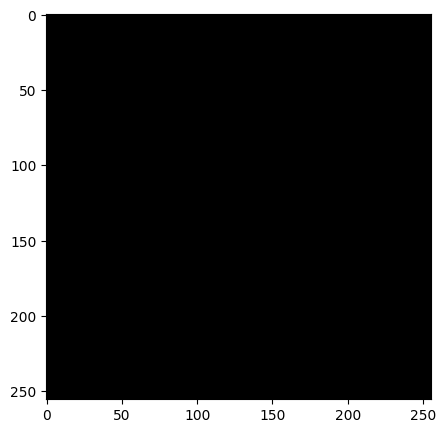

In [42]:
plt.figure(figsize=(5, 5))
plt.imshow(masked_target.numpy()[0, :, 200, :], cmap='gray')

In [43]:
sample['mask'].type(torch.bool)

tensor([[[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]],

         [[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]],

         [[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False,

In [44]:
nonzero_mask = torch.nonzero(masked_target).numpy()

In [45]:
nonzero_mask.shape

(4190329, 4)

In [46]:
random_slice = nonzero_mask[np.random.randint(0, nonzero_mask.shape[0])]
_, x, y, z = random_slice
print(random_slice)

[  0 167 134 151]


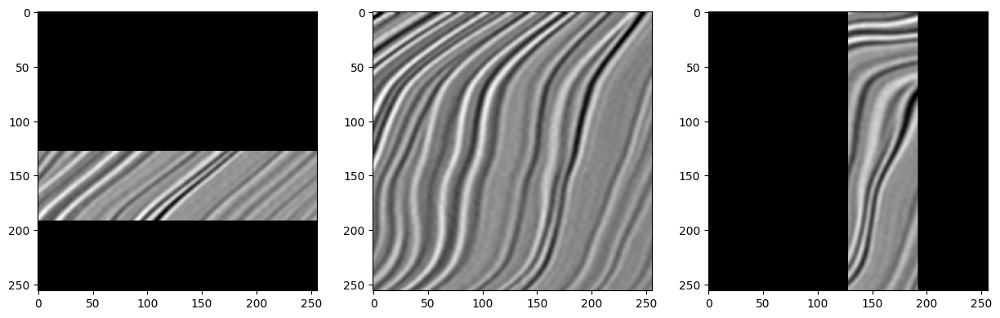

In [47]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 3, 1)
plt.imshow(masked_target[0, x, :, :], cmap='gray')
plt.subplot(1, 3, 2)
plt.imshow(masked_target[0, :, y, :], cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(masked_target[0, :, :, z], cmap='gray')

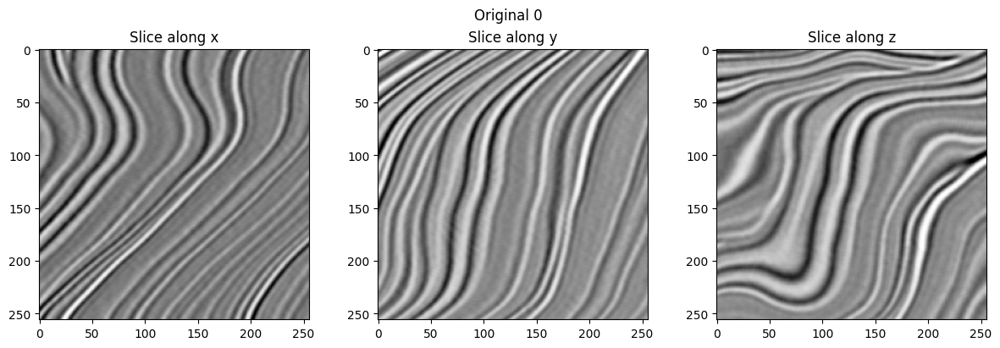

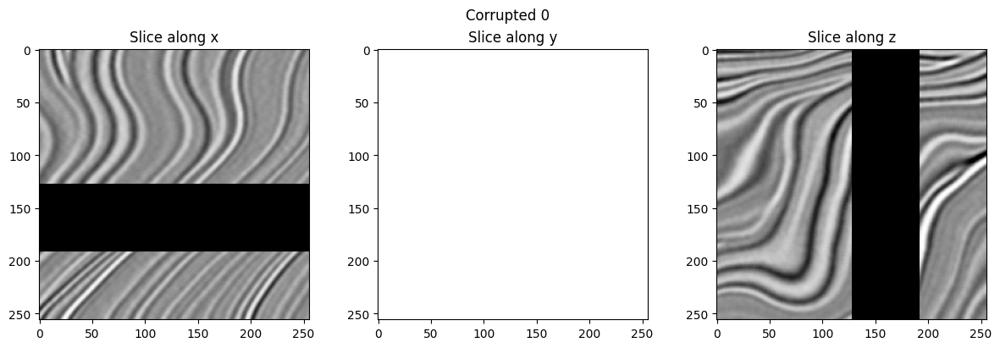

In [48]:
visualize_volumes(sample, 0, ['target', 'image'], ['Original', 'Corrupted'])

#### Problems
1. The whole volume can't fit into the memory
2. U-Net imposes constraints on the sizes of the volumes because of the down and up samplings

https://github.com/Project-MONAI/tutorials/blob/main/modules/UNet_input_size_constraints.ipynb

In [49]:
from torchmetrics.functional.image import structural_similarity_index_measure

def ssim_loss(preds, target):
    return 1 - structural_similarity_index_measure(preds, target, data_range=1.0)

In [48]:
max_epochs = 50

checkpoint_dir = Path('/kaggle/working/unet-8-ssim')

checkpoint_callback = pl.callbacks.ModelCheckpoint(dirpath=checkpoint_dir, filename='{epoch}-{val_loss:.2f}-{train_loss:.2f}', 
                                      monitor='val_loss', save_last=True) 
early_stopping = pl.callbacks.EarlyStopping(monitor='val_loss', verbose=True)
 
net = Net(percentile=5, loss_func=ssim_loss)

trainer = pl.Trainer(
    max_epochs=max_epochs,
    default_root_dir=checkpoint_dir,
    callbacks=[checkpoint_callback, early_stopping],
    fast_dev_run=True
)

trainer.fit(net)

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:639: Checkpoint directory /kaggle/working/unet-8-ssim exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:293: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [54]:
os.listdir(MODELS_DIR / 'kaggle/working/unet-7')

['epoch=26-val_loss=0.02-train_loss=0.03.ckpt', 'lightning_logs']

In [55]:
net = Net.load_from_checkpoint(MODELS_DIR / 'kaggle/working/unet-7/epoch=26-val_loss=0.02-train_loss=0.03.ckpt', percentile=5)

net.eval()
net.prepare_data()
val_loader = net.val_dataloader()

#### Predictions with MSE Loss

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


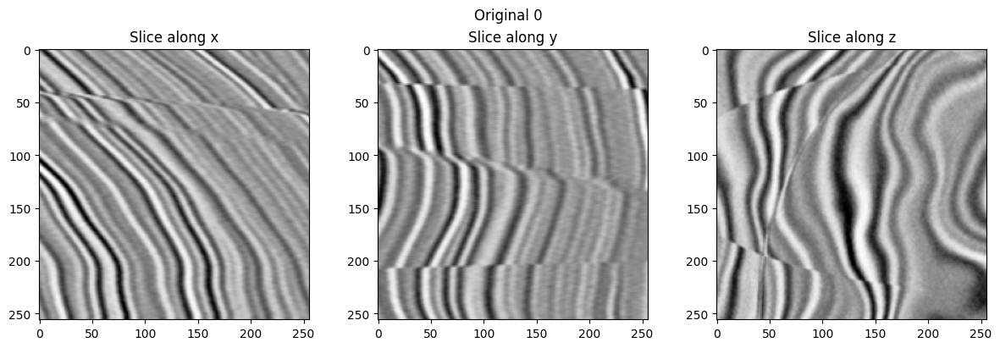

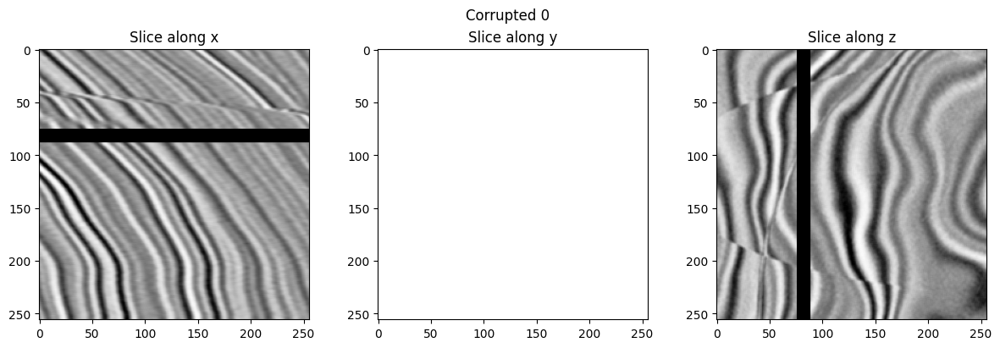

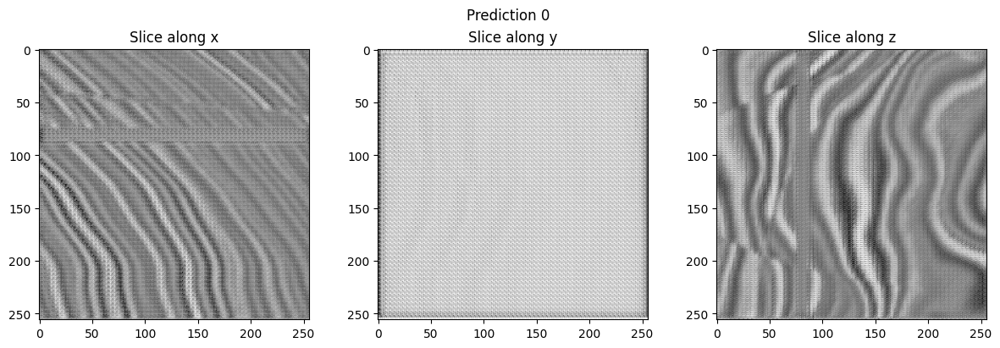

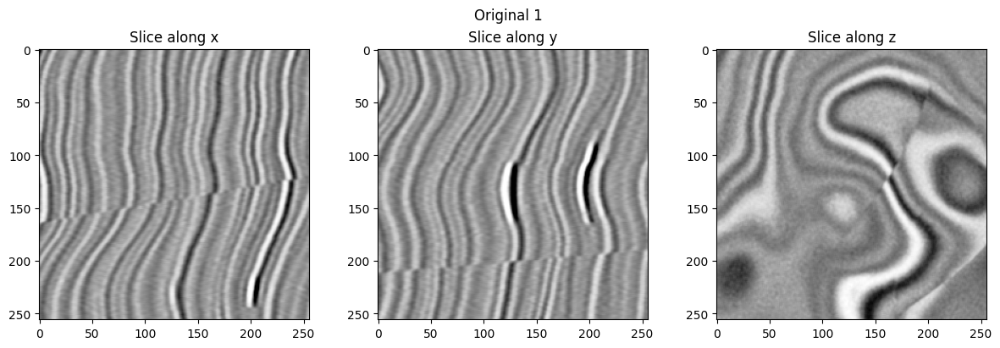

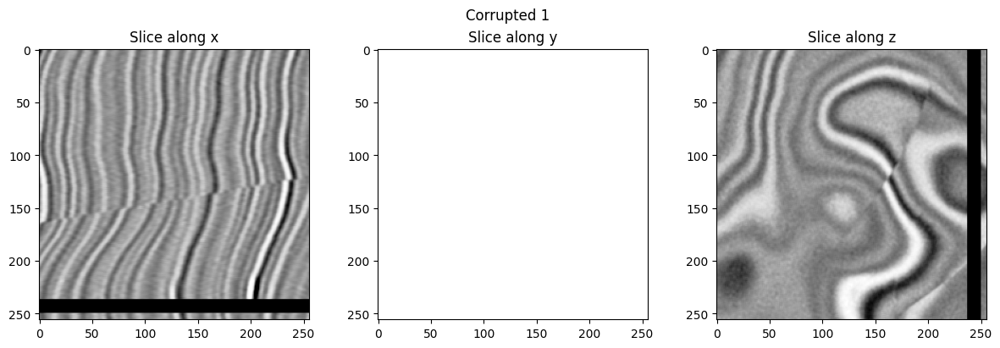

...

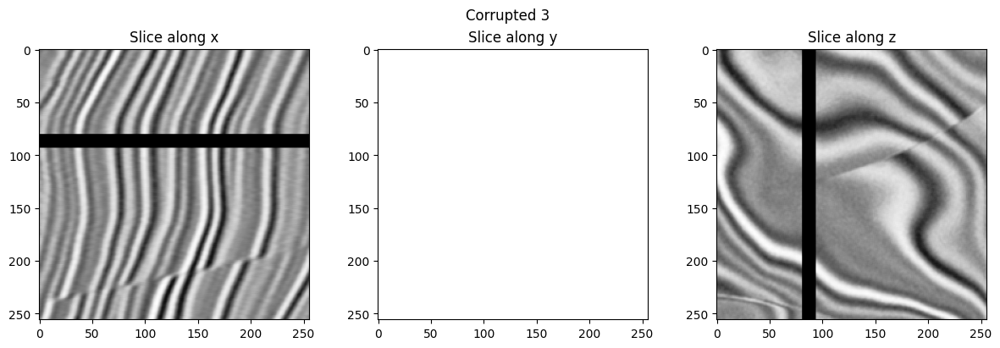

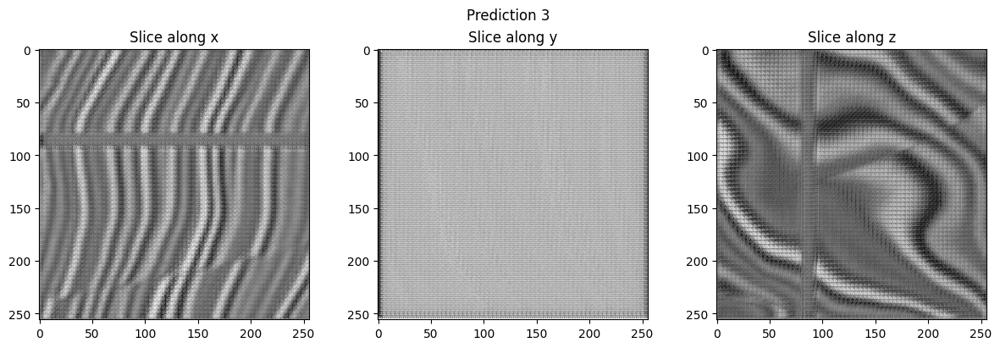

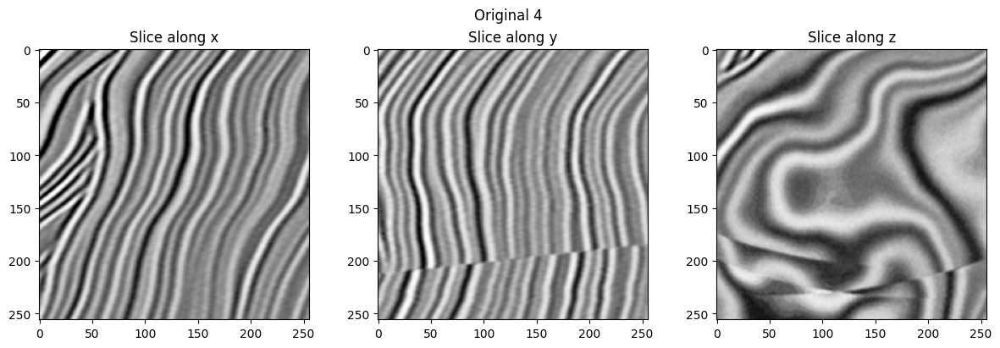

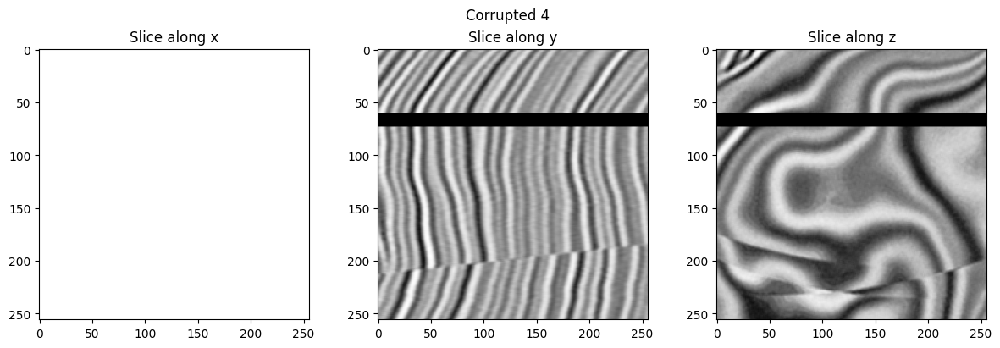

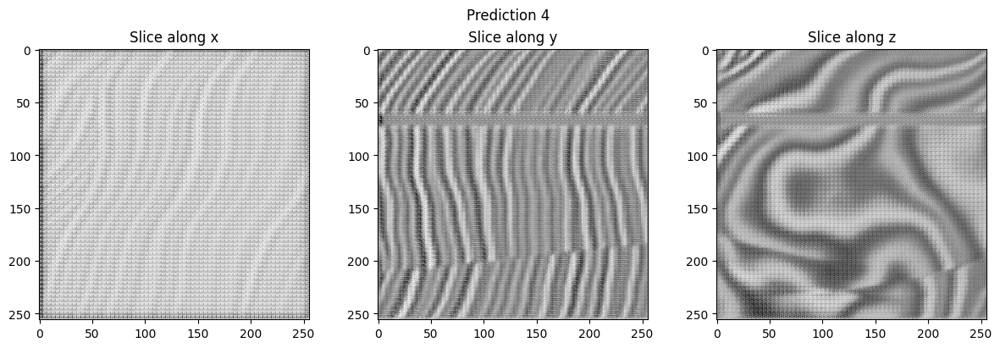

In [56]:
keys = ['target','image', 'prediction']
labels = ['Original','Corrupted', 'Prediction']

trainer = pl.Trainer()

for i, batch in enumerate(val_loader):
    prediction = net(batch['image'])
    batch['prediction'] = prediction
    visualize_volumes(batch, i, keys, labels, True)

In [58]:
os.listdir(MODELS_DIR / 'kaggle/working/unet-8-ssim')

['epoch=16-val_loss=0.24-train_loss=0.29.ckpt', 'lightning_logs']

In [59]:
net = Net.load_from_checkpoint(MODELS_DIR / 'kaggle/working/unet-8-ssim/epoch=16-val_loss=0.24-train_loss=0.29.ckpt', percentile=5, loss_func=ssim_loss)

_ = net.eval()

In [60]:
net.prepare_data()
val_loader = net.val_dataloader()

#### Predictions with SSIM Loss

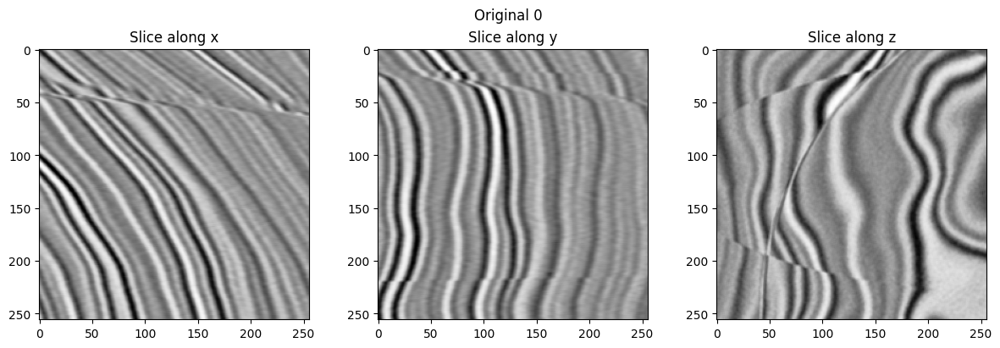

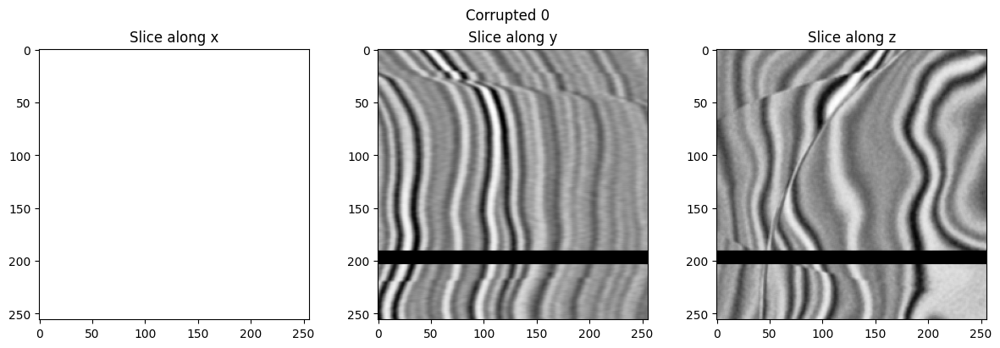

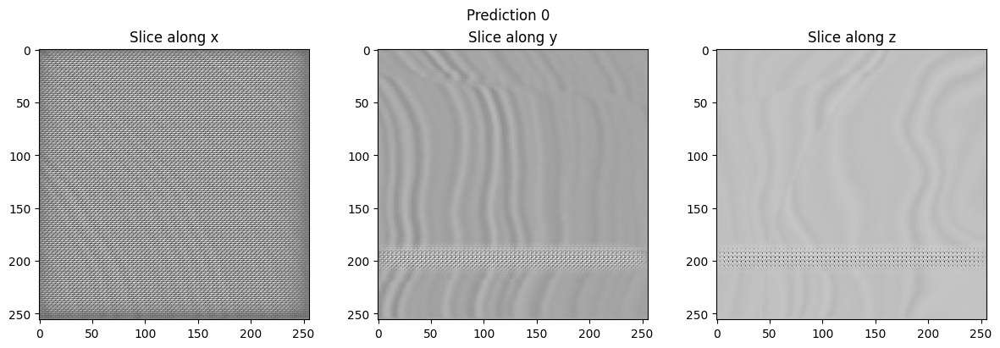

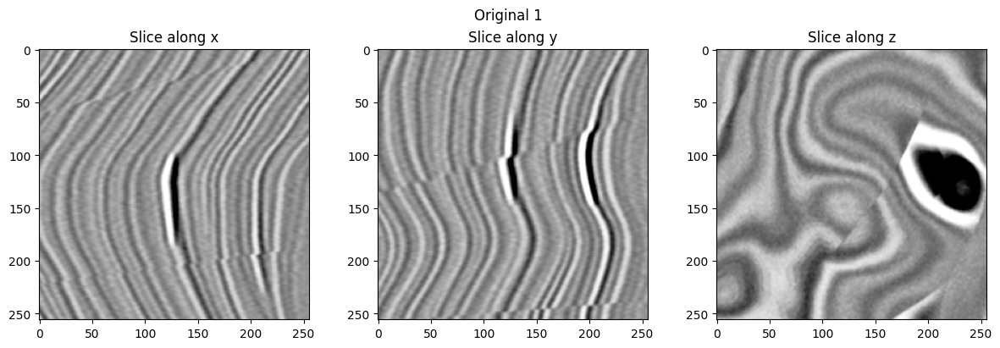

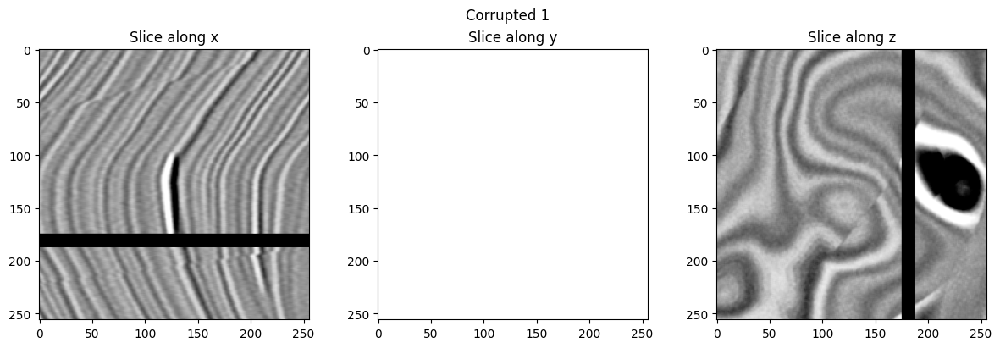

...

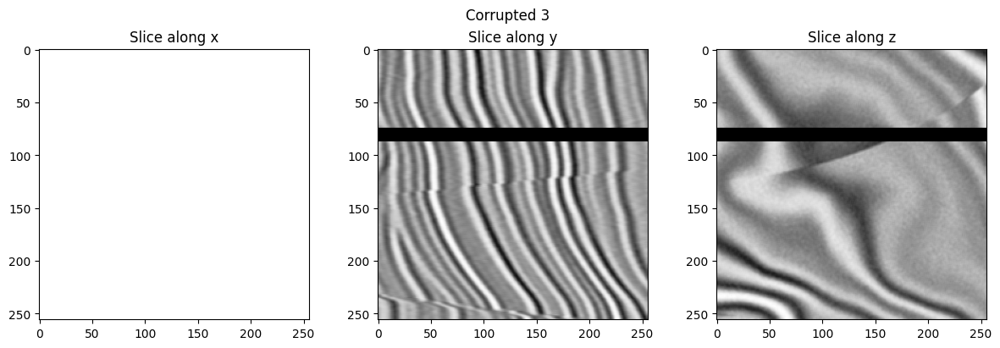

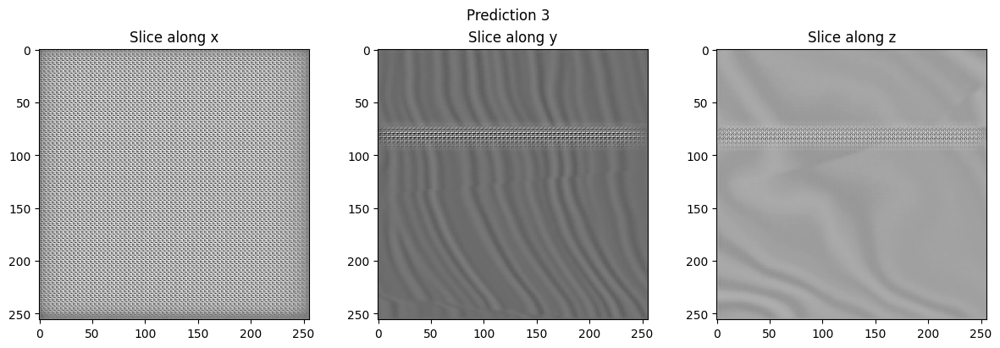

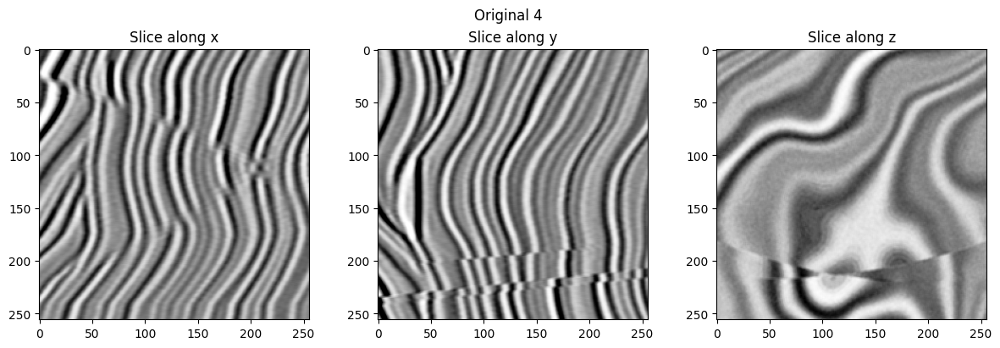

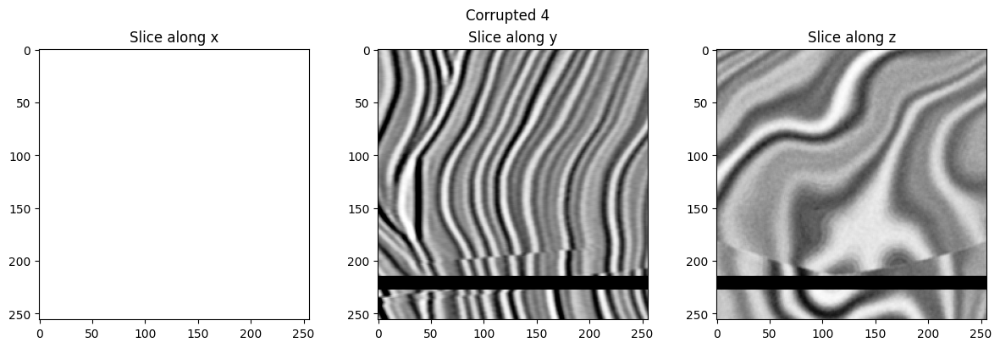

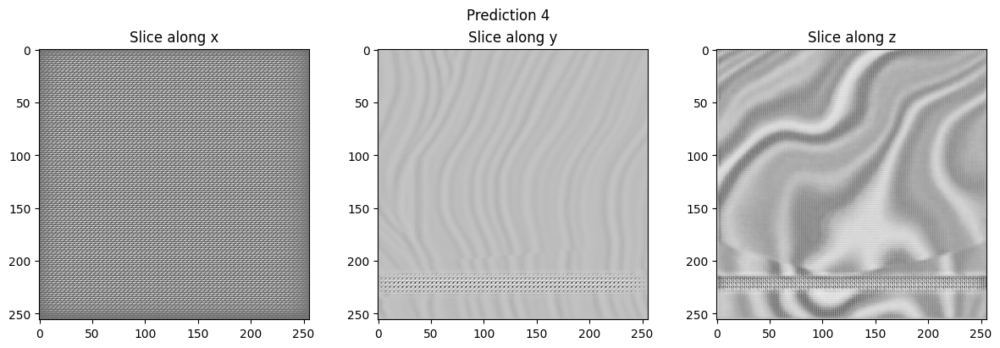

In [61]:
keys = ['target','image', 'prediction']
labels = ['Original','Corrupted', 'Prediction']
for i, batch in enumerate(val_loader):
    prediction = net(batch['image'])
    batch['prediction'] = prediction
    visualize_volumes(batch, i, keys, labels, True)